# ECSE 415 Assignment 1

**Important: This Notebook needs to be run sequentially**

In [113]:
## Imports ##
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [114]:
## Path to Images ##

from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/My Drive/Colab Notebooks/Assignment1/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Question 1: Image Filtering

*   Implementation of Gaussian Filter **(referenced tutorial 2)**
*   Implementation of Median Filter **(referenced tutorial 2)**



In [115]:
## Loading Grayscale Image of "task1.jpg" ##
task1 = cv.cvtColor(cv.imread(path + 'task1.jpg'), cv.COLOR_BGR2GRAY)

def gaussian_filter(image, kernel_size, sigma):
  '''
    Assume zero padding adding size length of kernel_size // 2
    Assume odd kernel_size
    Assume linear convolution
  '''
  kernel_dm = kernel_size // 2 # one side length of kernel

  ## Create Meshgrid of Kernel ##
  n = np.linspace(-kernel_dm, kernel_dm, kernel_size)
  x, y = np.meshgrid(n, n) # Generate coordinates

  ## Create Gaussian Kernel ##
  kernel = np.exp(-(x**2+y**2)/(2*(sigma**2))) # Calculate the Gaussian distribution and make the kernel
  normalized_kernel = kernel/np.sum(kernel) # Normalization

  ## Convolution ##
  image_p = np.pad(image, kernel_dm) # Padding for Gaussian Filtering
  output = np.zeros_like(image) # Initialize output

  # Loop for sweeping across image
  for i in range(kernel_dm, image.shape[0]-kernel_dm):
    for j in range(kernel_dm, image.shape[1]-kernel_dm):
      output[i-kernel_dm, j-kernel_dm] = np.sum(normalized_kernel * image_p[i - kernel_dm: i + kernel_dm+1, j - kernel_dm:j + kernel_dm+1]) # Convolution

  return output


def median_filter(image, kernel_size):
  '''
    Assume zero padding adding size length of kernel_size // 2
    Assume odd kernel_size
    Assume linear convolution
  '''
  # kernel_size here is the length of one side of the window
  kernel_dm = kernel_size // 2 # one side length of kernel

  ## Padding for Median Filtering ##
  image_p = np.pad(image, kernel_size)

  ## Initialize Output Image ##
  output = np.zeros_like(image)


  ## Loop for sweeping across image with kernel ##
  for i in range(kernel_dm, image.shape[0]-kernel_dm):
    for j in range(kernel_dm, image.shape[1]-kernel_dm):
      output[i-kernel_dm, j-kernel_dm] = np.median(image_p[i - kernel_dm: i + kernel_dm+1, j - kernel_dm:j + kernel_dm+1]) # Convolution

  return output


#### Displaying the Images after Transformation

(-0.5, 299.5, 399.5, -0.5)

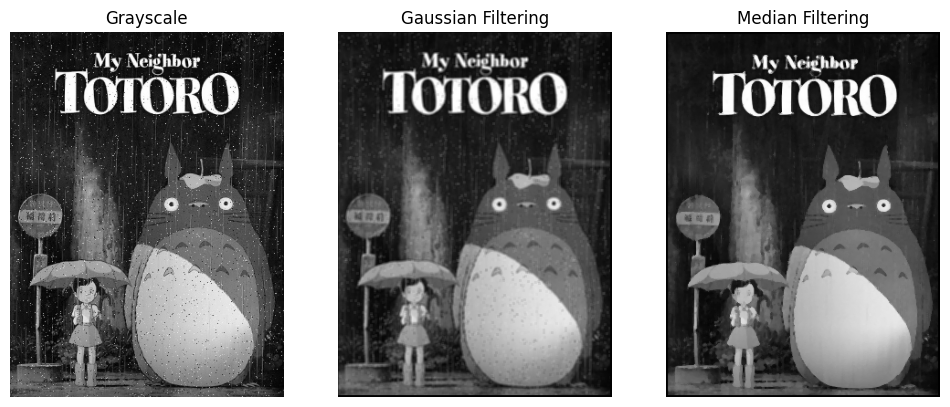

In [ ]:
# Grayscale Image
plt.figure(figsize=(12,6))
plt.subplot(1,3,1)
plt.imshow(task1, cmap='gray')
plt.title("Grayscale")
plt.axis('off')

# Gaussian Filtered Image
plt.subplot(1,3,2)
plt.imshow(gaussian_filter(task1, kernel_size=3, sigma=3), cmap='gray')
plt.title("Gaussian Filtering")
plt.axis('off')

# Median Filtered Image
plt.subplot(1,3,3)
plt.imshow(median_filter(task1, kernel_size=3), cmap='gray')
plt.title("Median Filtering")
plt.axis('off')

 ## Answers to Questions

1.   How does the Gaussian filter affect the edges and details in the image compared to the Median filter?

*   *Gaussian filter blurs edges more than the Median filter. Median filter tends to sharpen the image and preserve the edges*
---

2.   Which filter is more effective at reducing salt-and-pepper noise? Why?

*   *The Median filter is more effective at reducing salt-and-pepper noise because it is a non-linear filter that replaces each pixel with the median of its neighborhood. It is not as affected by extreme outliers in a neighborhood and can remove small isolated noises (like salt-and-pepper noise) without altering the image features.*
---

3.   How do the kernel size and sigma parameters impact the results of Gaussian filtering?

*   *Kernel Size: As kernel size increases, the kernel blurs within a larger neighborhood.*
*   *Sigma: Sigma determines the spread of the Gaussian function and blurs the image in a wider radius*
---

4.   How does the kernel size impact the results of Median filtering?

*   *The larger the kernel size, the more blurred the result of Median filtering. However, using too large of a kernel can cause the lost of original small features.*

## Question 2: Canny Edge Detection

*   Comparing thresholds
*   Pre-processing
*   Post-processing



(-0.5, 719.5, 479.5, -0.5)

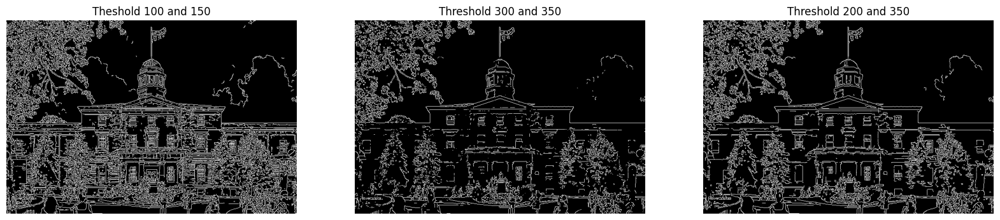

In [117]:
## Loading Grayscale Image of "task2.jpg" ##
task2 = cv.cvtColor(cv.imread(path + 'task2.jpg'), cv.COLOR_BGR2GRAY)


## Display Canny Edge with Different Thresholds ##

# Theshold 100 and 150
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
plt.imshow(cv.Canny(task2, threshold1=100, threshold2=150), cmap='gray')
plt.title("Theshold 100 and 150")
plt.axis('off')

# Threshold 300 and 350
plt.subplot(1,3,2)
plt.imshow(cv.Canny(task2, threshold1=300, threshold2=350), cmap='gray')
plt.title("Threshold 300 and 350")
plt.axis('off')

# Threshold 200 and 350
plt.subplot(1,3,3)
plt.imshow(cv.Canny(task2, threshold1=200, threshold2=350), cmap='gray')
plt.title("Threshold 200 and 350")
plt.axis('off')

(-0.5, 719.5, 479.5, -0.5)

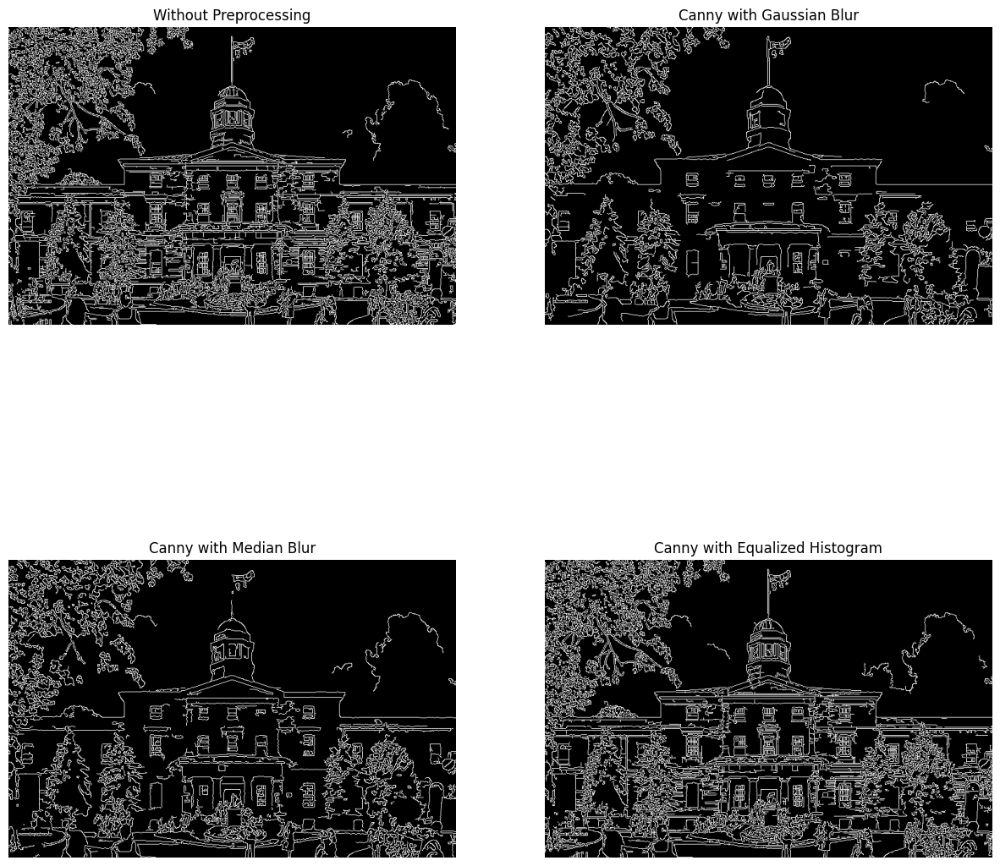

In [118]:
## Preprocessing
task2 = cv.cvtColor(cv.imread(path + 'task2.jpg'), cv.COLOR_BGR2GRAY)
task2_g = cv.GaussianBlur(task2, (3, 3), 9)
task2_m = cv.medianBlur(task2, 3)
task2_h = cv.equalizeHist(task2)

# Without Preprocessing
plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(cv.Canny(task2, threshold1=100, threshold2=300), cmap='gray')
plt.title("Without Preprocessing")
plt.axis('off')

# With Gaussian Blur
plt.subplot(2,2,2)
plt.imshow(cv.Canny(task2_g, threshold1=100, threshold2=300), cmap='gray')
plt.title("Canny with Gaussian Blur")
plt.axis('off')

# With Median Blur
plt.subplot(2,2,3)
plt.imshow(cv.Canny(task2_m, threshold1=100, threshold2=300), cmap='gray')
plt.title("Canny with Median Blur")
plt.axis('off')

# With Equalized Histogram
plt.subplot(2,2,4)
plt.imshow(cv.Canny(task2_h, threshold1=100, threshold2=300), cmap='gray')
plt.title("Canny with Equalized Histogram")
plt.axis('off')

### Post-Processing with Morphological Closing (Dilation and then Erosion)
Please run the cell above before running this cell

(-0.5, 719.5, 479.5, -0.5)

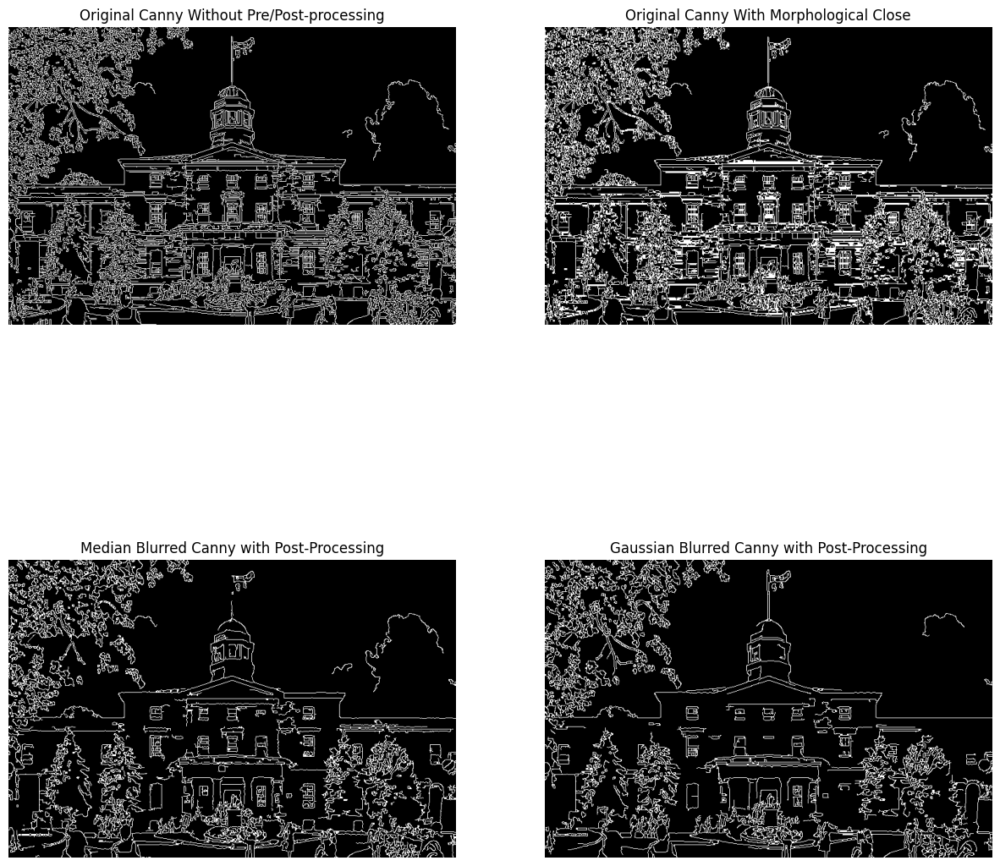

In [119]:
## Morphological Close applies Dilation and then Erosion ##
task2 = cv.cvtColor(cv.imread(path + 'task2.jpg'), cv.COLOR_BGR2GRAY)
task2_p = cv.morphologyEx(cv.Canny(task2, threshold1=100, threshold2=300), cv.MORPH_CLOSE, (3,3)) # Without pre/post processing
task2_g = cv.morphologyEx(cv.Canny(task2_g, threshold1=100, threshold2=300), cv.MORPH_CLOSE, (3,3)) # Gaussian filtering with post processing
task2_m = cv.morphologyEx(cv.Canny(task2_m, threshold1=100, threshold2=300), cv.MORPH_CLOSE, (3,3)) # Median filtering with post processing

## Comparisons ##

# Without Preprocessing
plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(cv.Canny(task2, threshold1=100, threshold2=300), cmap='gray')
plt.title("Original Canny Without Pre/Post-processing")
plt.axis('off')

# With Gaussian Blur
plt.subplot(2,2,2)
plt.imshow(task2_p, cmap='gray')
plt.title("Original Canny With Morphological Close")
plt.axis('off')

# With Median Blur
plt.subplot(2,2,3)
plt.imshow(task2_m, cmap='gray')
plt.title("Median Blurred Canny with Post-Processing")
plt.axis('off')

# With Equalized Histogram
plt.subplot(2,2,4)
plt.imshow(task2_g, cmap='gray')
plt.title("Gaussian Blurred Canny with Post-Processing")
plt.axis('off')

### With Best Threshold (min_thresh=200, max_thresh=350, median blur, morphological closing)
The previous sections was to demonstrate the effect of using processing on a noisy image, but what if Canny detector without processing already performs well?

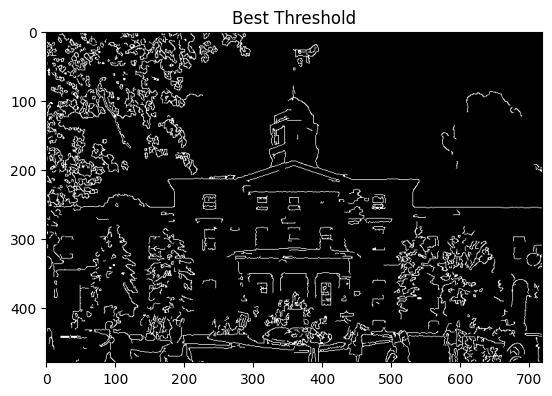

In [120]:
task2 = cv.cvtColor(cv.imread(path + 'task2.jpg'), cv.COLOR_BGR2GRAY)

# Pre-processing
best = cv.medianBlur(task2, 3)
best = cv.Canny(best, threshold1=200, threshold2=350)

# Post-processing
best = cv.morphologyEx(best, cv.MORPH_CLOSE, (3,3))

plt.title("Best Threshold")
plt.imshow(best, cmap='gray')

The above shows that no one pre/post-processing pipeline for Canny is suitable for all images.

## Answers to Questions

1. Summarize your findings in a markdown cell. Discuss how each pre-processing and postprocessing step influenced the edge detection results. Highlight the parameter settings that produced the best edges.

*   *For Canny, a higher threshold means that less edges are being identified, and a lower threshold tends to lead to noisy results. A greater range between the threshold indicates that more edges will be detected.*
---
*   *In the preprocessing step, with the same threshold range, Gaussian filtering and Median filtering yields the best result (less edges and less clustered). Gaussian filtering blurs the image and small details and removes harsh edges. Median filtering sharpens the image' significant edges while removing less significant details and smaller noises. Equalized histogram adjusts the image's contrast but will still retain small insignificant details.*
---
*   *In the postprocessing step, since the original Canny image was very noisy, using morphological closing (dilation followed by erosion) made the image even more noisy with connected edges. However, if we use the two Canny images with pre-processing that performed well, then the morphological closing connected disconnected edges and the edges looked more coherent.
---
*   *Best Parameter Settings: after testing a few thresholds, I was happy with the results yielded by `threshold1=100`and `threshold2=300`. I believed that Gaussian filtered image with post-processing (one iteration of morphological closing) yielded the best result, and I used `kernel_size=3` and `sigma=9` to achieve it, although I did realize that sigma did not make too much changes to the number of edges detected. It is to be noted however that the choice of `threshold1` and `threshold2` greatly influenced the choice of pre-processing techniques and post-processing techniques, as some techniques may remove crucial edges to the image.





## Question 3: Harris Corner Detection

*   Calculate Image Derivatives $I_x$, $I_y$
*   Calculate Matrix Multiplications $I_x^2$, $I_y^2$, $I_xI_y$
*   Apply Gaussian filtering on Matrix Multiplications

(-0.5, 359.5, 359.5, -0.5)

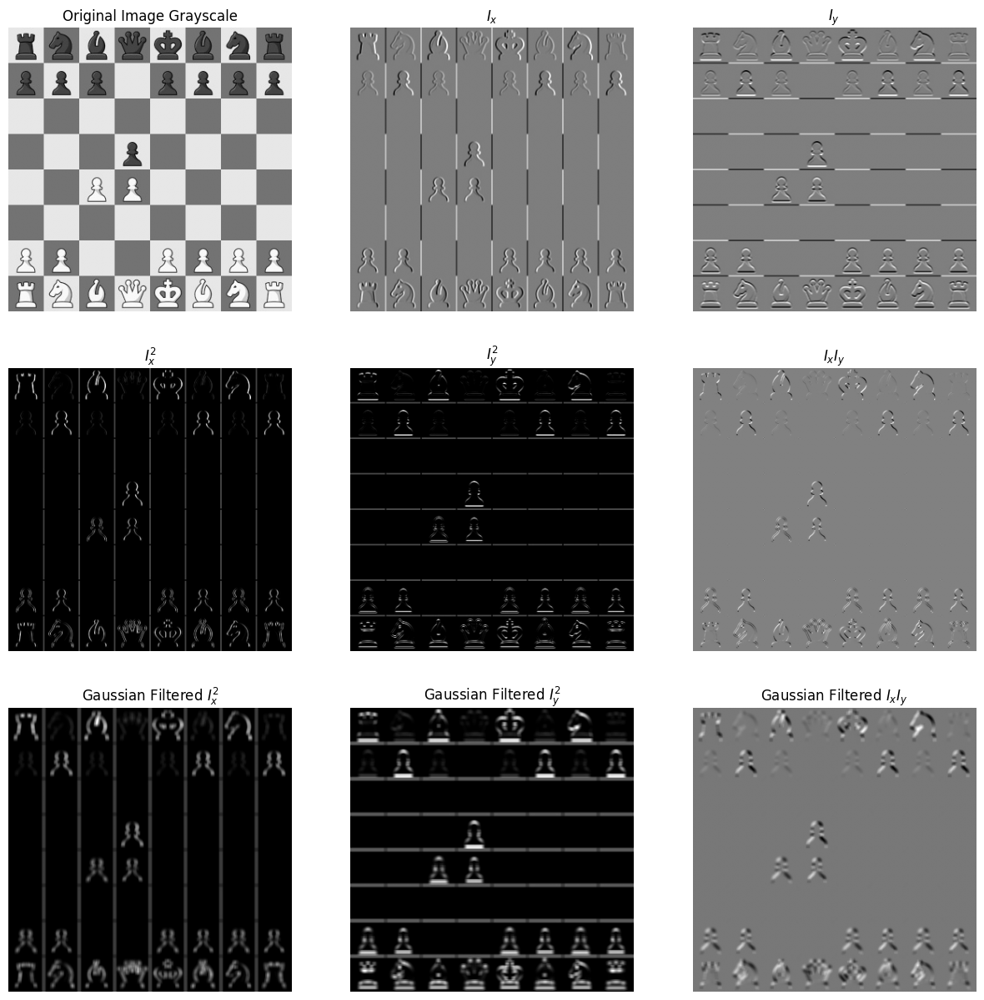

In [121]:
## Loading Grayscale Image of "task3.jpg" ##
task3 = cv.cvtColor(cv.imread(path + 'task3.jpg'), cv.COLOR_BGR2GRAY)

## Compute Image Derivatives in x and y ##)
Ix = cv.Sobel(task3, cv.CV_32F, 1, 0, ksize=3)
Iy = cv.Sobel(task3, cv.CV_32F, 0, 1, ksize=3)


## Matrix Multiplications ##
Ix2 = Ix * Ix
Iy2 = Iy * Iy
Ixy = Ix * Iy


## Gaussian Smoothing ##
Ix2_g = cv.GaussianBlur(Ix2, (5, 5), 3)
Iy2_g = cv.GaussianBlur(Iy2, (5, 5), 3)
Ixy_g = cv.GaussianBlur(Ixy, (5, 5), 3)


## Rendering Images ##
plt.figure(figsize=(15,15))

# Original Image
plt.subplot(3,3,1)
plt.imshow(task3, cmap='gray')
plt.title("Original Image Grayscale")
plt.axis('off')

# Derivative in x
plt.subplot(3,3,2)
plt.imshow(Ix, cmap='gray')
plt.title("$I_x$")
plt.axis('off')

# Derivative in y
plt.subplot(3,3,3)
plt.imshow(Iy, cmap='gray')
plt.title("$I_y$")
plt.axis('off')

# Ix Squared
plt.subplot(3,3,4)
plt.imshow(Ix2, cmap='gray')
plt.title("$I_x^2$")
plt.axis('off')

# Iy Squared
plt.subplot(3,3,5)
plt.imshow(Iy2, cmap='gray')
plt.title("$I_y^2$")
plt.axis('off')

# Ixy
plt.subplot(3,3,6)
plt.imshow(Ixy, cmap='gray')
plt.title("$I_xI_y$")
plt.axis('off')

# Ix Squared Gaussian
plt.subplot(3,3,7)
plt.imshow(Ix2_g, cmap='gray')
plt.title("Gaussian Filtered $I_x^2$")
plt.axis('off')

# Iy Squared Gaussian
plt.subplot(3,3,8)
plt.imshow(Iy2_g, cmap='gray')
plt.title("Gaussian Filtered $I_y^2$")
plt.axis('off')

# Ixy Gaussian
plt.subplot(3,3,9)
plt.imshow(Ixy_g, cmap='gray')
plt.title("Gaussian Filtered $I_xI_y$")
plt.axis('off')

### Compute Corner Response Function

(<matplotlib.image.AxesImage at 0x7ecfe4832190>, ([], []), ([], []))

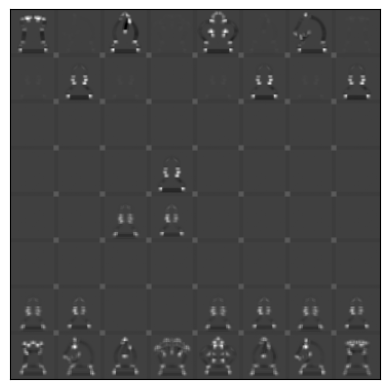

In [122]:
# Trace is the sum of diagonals
k = 0.05 # Sensitivity factor
R = ((Ix2_g * Iy2_g) - (Ixy_g * Ixy_g)) - k * ((Ix2_g + Iy2_g) * (Ix2_g + Iy2_g))

plt.imshow(R, cmap='gray'), plt.xticks([]), plt.yticks([])

### Non-Maximum Suppression (NMS)



(362, 362)


(<matplotlib.image.AxesImage at 0x7ecfe48951d0>, ([], []), ([], []))

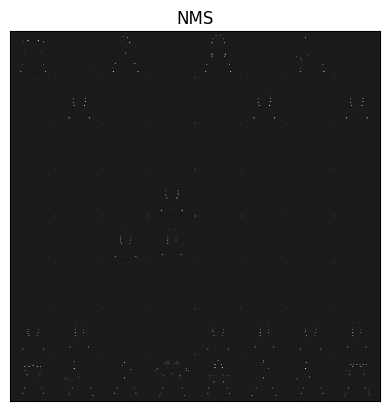

In [123]:
R_p = np.pad(R, 1, mode='constant', constant_values=0) # Padding for NMS
out_NMS = np.zeros_like(R) # Get the output image

print(R_p.shape)

## Loop for sweeping across image with kernel ##
for i in range(0, R.shape[0]):
  for j in range(0, R.shape[1]):
    # If the pixel in question has the maximum value in the neighboring eight pixels, then retain it. Otherwise, leave it as 0.
    if R_p[i+1, j+1] == np.max(R_p[i:i+3, j:j+3]):
      out_NMS[i,j] = R[i,j]

plt.title("NMS")
plt.imshow(out_NMS, cmap='gray'), plt.xticks([]), plt.yticks([])

### Thresholding to Locate Maxima
Corners Dotted in Black

(-0.5, 359.5, 359.5, -0.5)

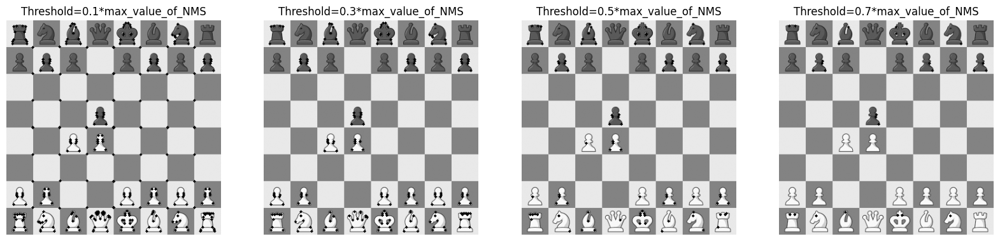

In [124]:
## Set Different Thresholds ##
threshold_value1 = 0.1*out_NMS.max()
threshold_value2 = 0.3*out_NMS.max()
threshold_value3 = 0.5*out_NMS.max()
threshold_value4 = 0.7*out_NMS.max()


## Threshold the NMS Image ##
_, thresh1 = cv.threshold(out_NMS, threshold_value1, 255, cv.THRESH_BINARY)
_, thresh2 = cv.threshold(out_NMS, threshold_value2, 255, cv.THRESH_BINARY)
_, thresh3 = cv.threshold(out_NMS, threshold_value3, 255, cv.THRESH_BINARY)
_, thresh4 = cv.threshold(out_NMS, threshold_value4, 255, cv.THRESH_BINARY)


## Improve contrast of the remaining pixels in NMS image ##
thresh1[thresh1!=0] = 255
thresh2[thresh2!=0] = 255
thresh3[thresh3!=0] = 255
thresh4[thresh4!=0] = 255
thresh1 = thresh1.astype(np.uint8)
thresh2 = thresh2.astype(np.uint8)
thresh3 = thresh3.astype(np.uint8)
thresh4 = thresh4.astype(np.uint8)

# to contour the detected pixel (make it more visible)
thresh1 = cv.drawContours(thresh1, cv.findContours(thresh1, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[0], -1, (255, 255, 0), 3)
thresh2 = cv.drawContours(thresh2, cv.findContours(thresh2, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[0], -1, (255, 255, 0), 3)
thresh3 = cv.drawContours(thresh3, cv.findContours(thresh3, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[0], -1, (255, 255, 0), 3)
thresh4 = cv.drawContours(thresh4, cv.findContours(thresh4, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[0], -1, (255, 255, 0), 3)

# make the detected pixel black and background white (prepare for overlay)
inverse_thresh1 = cv.bitwise_not(thresh1)
inverse_thresh2 = cv.bitwise_not(thresh2)
inverse_thresh3 = cv.bitwise_not(thresh3)
inverse_thresh4 = cv.bitwise_not(thresh4)


## Overlay Original Image with Detected Corner ##
overlay1 = cv.bitwise_and(task3, task3, mask=inverse_thresh1)
overlay2 = cv.bitwise_and(task3, task3, mask=inverse_thresh2)
overlay3 = cv.bitwise_and(task3, task3, mask=inverse_thresh3)
overlay4 = cv.bitwise_and(task3, task3, mask=inverse_thresh4)


## Visualize Different Threshold Values ##
plt.figure(figsize=(20,20))
plt.subplot(1,4,1)
plt.imshow(overlay1, cmap='gray')
plt.title("Threshold=0.1*max_value_of_NMS")
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(overlay2, cmap='gray')
plt.title("Threshold=0.3*max_value_of_NMS")
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(overlay3, cmap='gray')
plt.title("Threshold=0.5*max_value_of_NMS")
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(overlay4, cmap='gray')
plt.title("Threshold=0.7*max_value_of_NMS")
plt.axis('off')

## Answers to Question
1. Experiment with different threshold values to control the sensitivity of corner detection and summarize your findings on the effect of varying thresholds in a markdown cell.

*   *Threshold controls the strength of corner prediction. Through experimenting with the threshold, a higher threshold that is closer to the maximum of the non-maxima suppression image (out_NMS) will reduce the sensitivity of corner detection and consequently leave only the strongest detected corners*

## Question 4: SIFT Features

*   Brute Force Matching **(referenced tutorial 4)**
*   Scale Invariance
*   Rotation Invariance

### Brute Force Matching

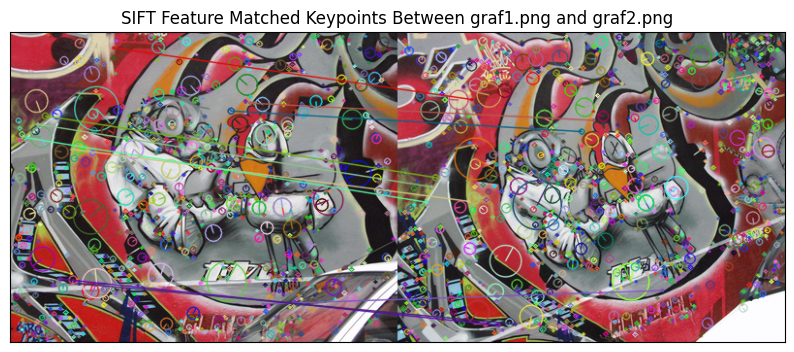

In [125]:
## Load Image ##
graf1 = cv.cvtColor(cv.imread(path+"graf1.png"), cv.COLOR_BGR2RGB)
graf2 = cv.cvtColor(cv.imread(path+"graf2.png"), cv.COLOR_BGR2RGB)


## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)
keypoints2, descriptors2 = sift.detectAndCompute(graf2, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors1, descriptors2) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(graf1, keypoints1, graf2,keypoints2, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.title("SIFT Feature Matched Keypoints Between graf1.png and graf2.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)

### Scale Invariance

*   0.5x Scaling
*   2x Scaling
*   4x Scaling

(-0.5, 399.5, 319.5, -0.5)

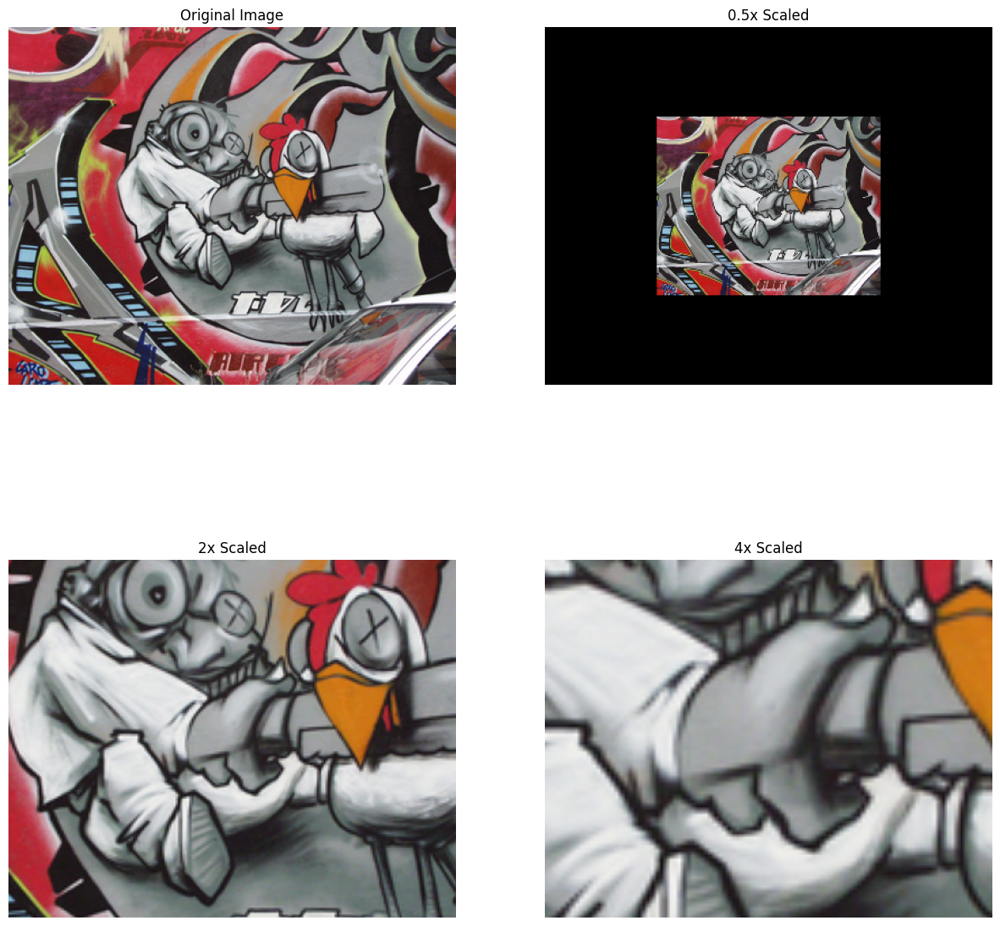

In [126]:
h, w = graf1.shape[0:2] # get height and width of graf1

## Create a Scaling Matrix and Apply to Image ##
M1 = cv.getRotationMatrix2D((w/2, h/2), 0, 0.5)
M2 = cv.getRotationMatrix2D((w/2, h/2), 0, 2)
M3 = cv.getRotationMatrix2D((w/2, h/2), 0, 4)

# Applying scaling matrix. Output is the same size as input
out1 = cv.warpAffine(graf1, M1, (w, h))
out2 = cv.warpAffine(graf1, M2, (w, h))
out3 = cv.warpAffine(graf1, M3, (w, h))


## Display Images ##
plt.figure(figsize=(15,15))
# Original Image
plt.subplot(2,2,1)
plt.imshow(graf1)
plt.title("Original Image")
plt.axis('off')

# 0.5x Scaled
plt.subplot(2,2,2)
plt.imshow(out1)
plt.title("0.5x Scaled")
plt.axis('off')

# 2x Scaled
plt.subplot(2,2,3)
plt.imshow(out2)
plt.title("2x Scaled")
plt.axis('off')

# 4x Scaled
plt.subplot(2,2,4)
plt.imshow(out3)
plt.title("4x Scaled")
plt.axis('off')

#### 0.5x Scaling Matching

Distance of the Top Keypoint is: 8.062257766723633


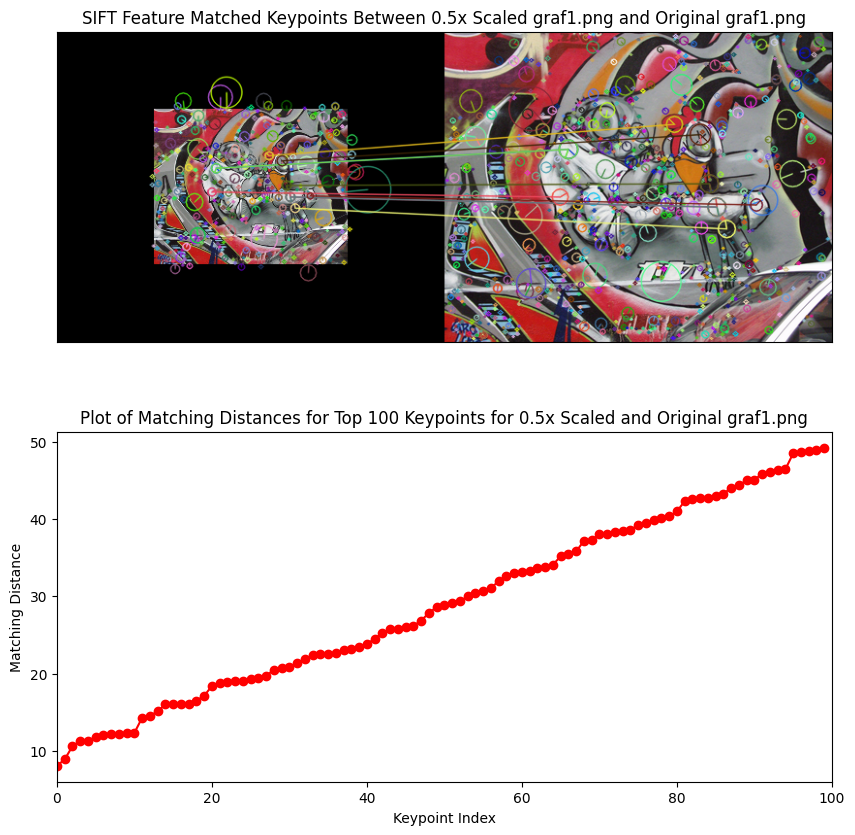

In [127]:
# out1 is the 0.5x scaled image

## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints_s05, descriptors_s05 = sift.detectAndCompute(out1, None) # SIFT keypoints and descriptors for 0.5x scaling
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors_s05, descriptors1) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(out1, keypoints_s05, graf1,keypoints1, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("SIFT Feature Matched Keypoints Between 0.5x Scaled graf1.png and Original graf1.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)


## Plot Top 100 Match Distances ##
print("Distance of the Top Keypoint is:", matches[0].distance) # distance of the top index
distances1 = []
for m in matches[:100]:
  distances1.append(m.distance)

plt.subplot(2,1,2)
# plt.bar(np.arange(0, 100), distances, edgecolor='k')
plt.plot(np.arange(0,100), distances1, 'r-o')
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 0.5x Scaled and Original graf1.png")
plt.show()

#### 2x Scaling Matching

Distance of the Top Keypoint is: 7.6157732009887695


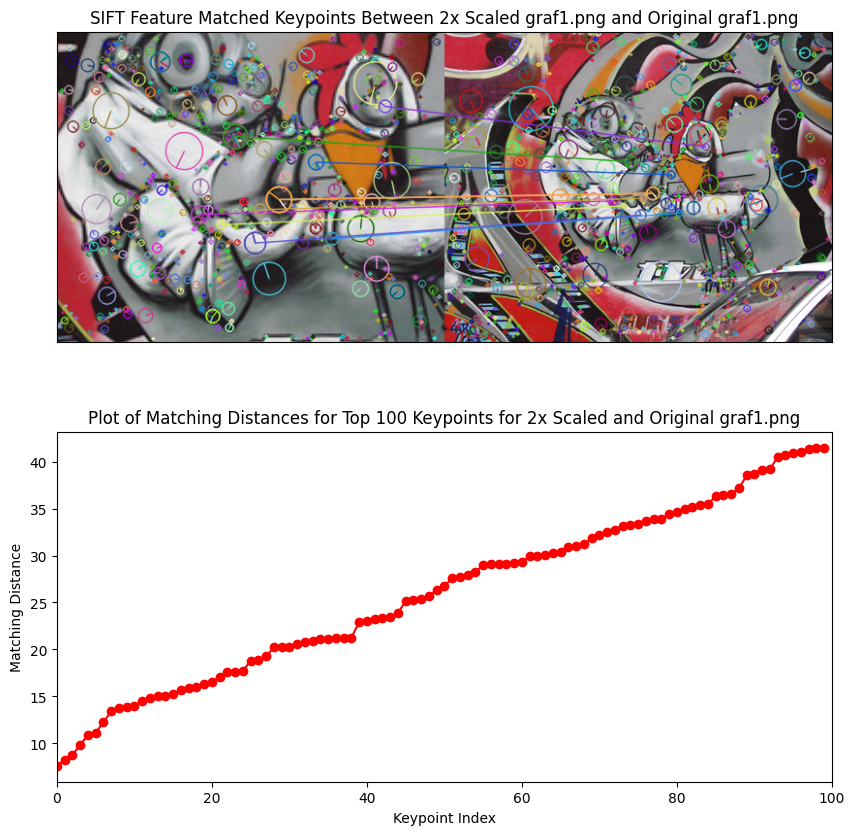

In [128]:
# out2 is the 2x scaled image

## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints_s2, descriptors_s2 = sift.detectAndCompute(out2, None) # SIFT keypoints and descriptors for 2x scaling
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors_s2, descriptors1) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(out2, keypoints_s2, graf1,keypoints1, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("SIFT Feature Matched Keypoints Between 2x Scaled graf1.png and Original graf1.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)


## Plot Top 100 Match Distances ##
print("Distance of the Top Keypoint is:", matches[0].distance) # distance of the top index
distances2 = []
for m in matches[:100]:
  distances2.append(m.distance)

plt.subplot(2,1,2)
# plt.bar(np.arange(0, 100), distances, edgecolor='k')
plt.plot(np.arange(0,100), distances2, 'r-o')
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 2x Scaled and Original graf1.png")
plt.show()

#### 4x Scaling Matching

Distance of the Top Keypoint is: 18.65475845336914


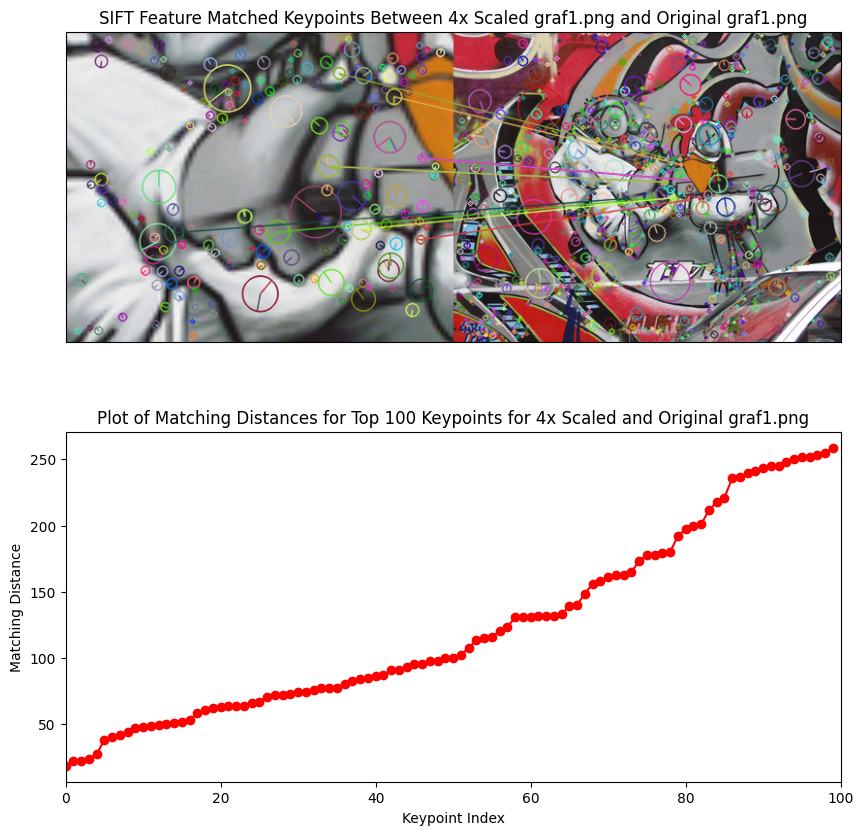

In [129]:
# out3 is the 4x scaled image

## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints_s4, descriptors_s4 = sift.detectAndCompute(out3, None) # SIFT keypoints and descriptors for 4x scaling
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors_s4, descriptors1) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(out3, keypoints_s4, graf1,keypoints1, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("SIFT Feature Matched Keypoints Between 4x Scaled graf1.png and Original graf1.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)


## Plot Top 100 Match Distances ##
print("Distance of the Top Keypoint is:", matches[0].distance) # distance of the top index
distances3 = []
for m in matches[:100]:
  distances3.append(m.distance)

plt.subplot(2,1,2)
# plt.bar(np.arange(0, 100), distances, edgecolor='k')
plt.plot(np.arange(0,100), distances3, 'r-o')
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 4x Scaled and Original graf1.png")
plt.show()

#### All Plots Comparison

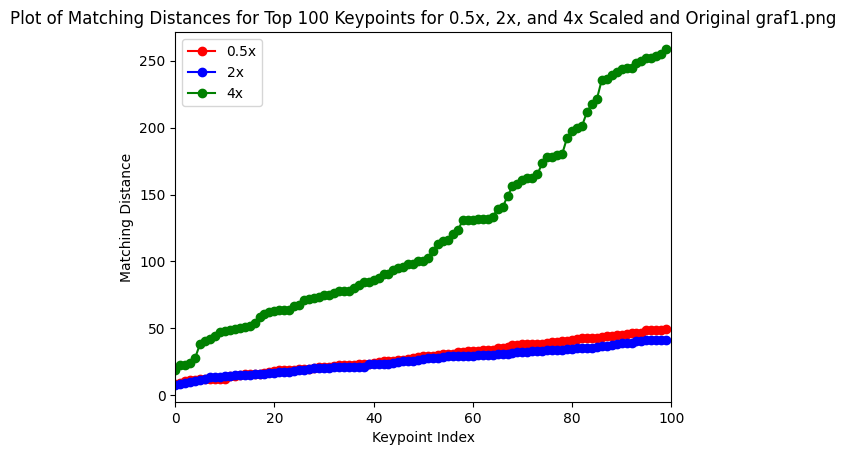

In [130]:
## Plot Comparisons of Matching Distance of Each Scaled Image ##
plt.plot(np.arange(0,100), distances1, 'r-o', label="0.5x")
plt.plot(np.arange(0,100), distances2, 'b-o', label="2x")
plt.plot(np.arange(0,100), distances3, 'g-o', label="4x")
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 0.5x, 2x, and 4x Scaled and Original graf1.png")
plt.legend()
plt.show()

## Answer to Question

1.   Discuss how scaling affects the matching distances in a markdown cell.
*   *Matching distance infers similarity between the matches in the two images. A lower distance indicates a better match. By looking at the "Plot of Matching Distances for Top 100 Keypoints" for each of the scaled image compared with the original image, images with greater scales (2x & 4x) have higher overall matching distances than 0.5x scaled image. However, between scaling of 0.5x and 2x, the difference is small.*

## Rotation Invariance

*   Rotation by 60°
*   Rotation by 120°
*   Rotation by 180°

In [131]:
h, w = graf1.shape[0:2] # get height and width of graf1

## Create a Rotation Matrix and Apply to Image ##
M1 = cv.getRotationMatrix2D((w/2, h/2), 60, 1)
M2 = cv.getRotationMatrix2D((w/2, h/2), 120, 1)
M3 = cv.getRotationMatrix2D((w/2, h/2), 180, 1)

# Applying scaling matrix. Output is the same size as input
out1 = cv.warpAffine(graf1, M1, (w, h))
out2 = cv.warpAffine(graf1, M2, (w, h))
out3 = cv.warpAffine(graf1, M3, (w, h))


## Display Images ##
plt.figure(figsize=(15,15))
# Original Image
plt.subplot(2,2,1)
plt.imshow(graf1)
plt.title("Original Image")
plt.axis('off')

# 60° Rotated
plt.subplot(2,2,2)
plt.imshow(out1)
plt.title("60° Rotated")
plt.axis('off')

# 120° Rotated
plt.subplot(2,2,3)
plt.imshow(out2)
plt.title("120° Rotated")
plt.axis('off')

# 180° Rotated
plt.subplot(2,2,4)
plt.imshow(out3)
plt.title("180° Rotated")
plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

#### 60° Rotated Matching

Distance of the Top Keypoint is: 10.58300495147705


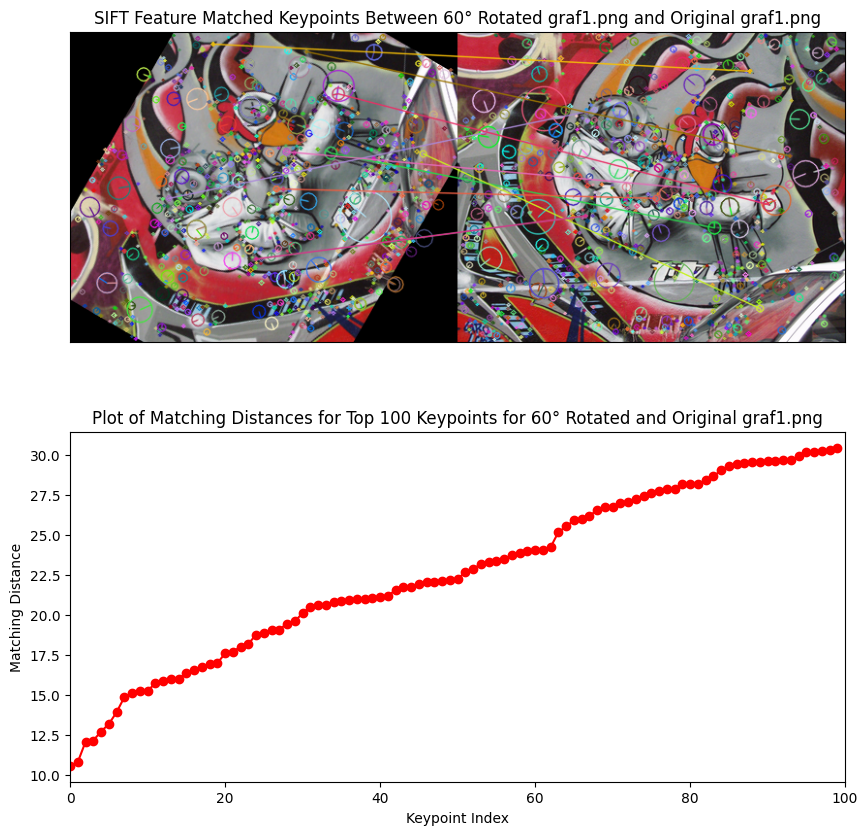

In [132]:
# out1 is the 60° rotated image

## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints_r60, descriptors_r60 = sift.detectAndCompute(out1, None) # SIFT keypoints and descriptors for 0.5x scaling
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors_r60, descriptors1) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(out1, keypoints_r60, graf1,keypoints1, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("SIFT Feature Matched Keypoints Between 60° Rotated graf1.png and Original graf1.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)


## Plot Top 100 Match Distances ##
print("Distance of the Top Keypoint is:", matches[0].distance) # distance of the top index
distances4 = []
for m in matches[:100]:
  distances4.append(m.distance)

plt.subplot(2,1,2)
# plt.bar(np.arange(0, 100), distances, edgecolor='k')
plt.plot(np.arange(0,100), distances4, 'r-o')
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 60° Rotated and Original graf1.png")
plt.show()

#### 120° Rotated Matching

Distance of the Top Keypoint is: 11.357816696166992


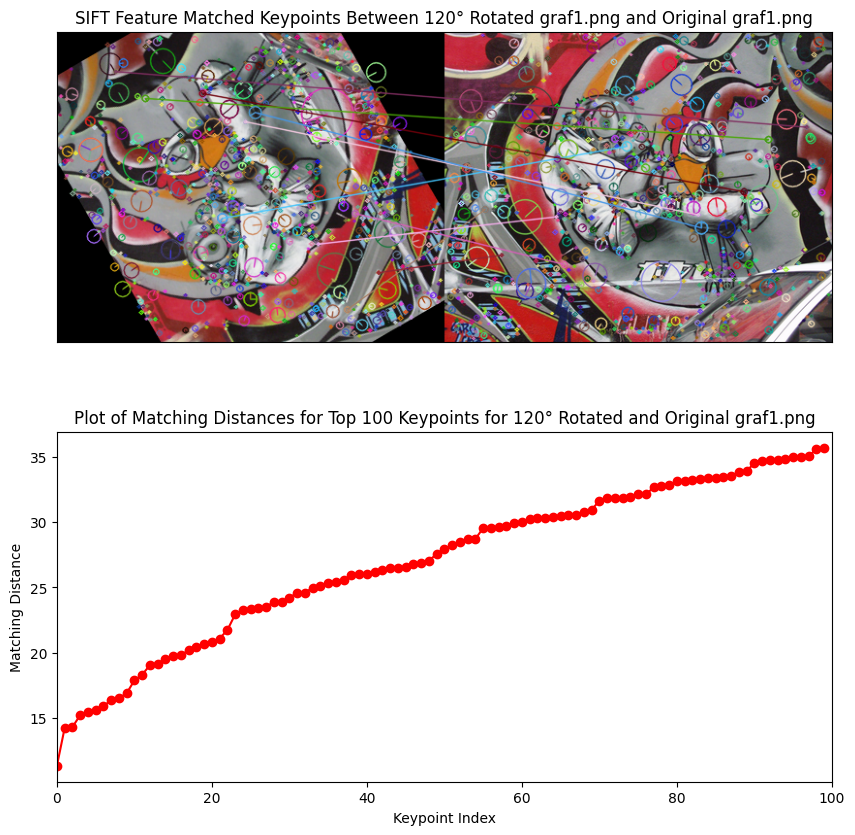

In [133]:
# out1 is the 120° rotated image

## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints_r120, descriptors_r120 = sift.detectAndCompute(out2, None) # SIFT keypoints and descriptors for 0.5x scaling
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors_r120, descriptors1) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(out2, keypoints_r120, graf1,keypoints1, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("SIFT Feature Matched Keypoints Between 120° Rotated graf1.png and Original graf1.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)


## Plot Top 100 Match Distances ##
print("Distance of the Top Keypoint is:", matches[0].distance) # distance of the top index
distances5 = []
for m in matches[:100]:
  distances5.append(m.distance)

plt.subplot(2,1,2)
# plt.bar(np.arange(0, 100), distances, edgecolor='k')
plt.plot(np.arange(0,100), distances5, 'r-o')
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 120° Rotated and Original graf1.png")
plt.show()

#### 180° Rotated Matching

Distance of the Top Keypoint is: 0.0


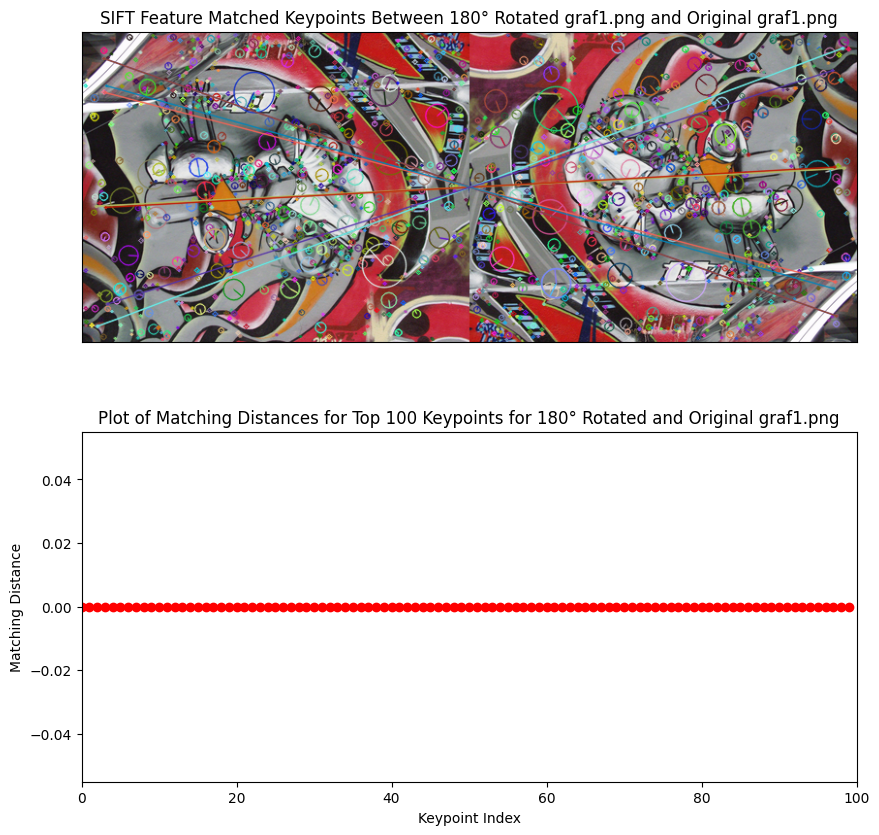

In [134]:
# out3 is the 180° rotated image

## Create SIFT Object and Compute Keypoints and Descriptors ##
sift = cv.SIFT_create()
keypoints_r180, descriptors_r180 = sift.detectAndCompute(out3, None) # SIFT keypoints and descriptors for 0.5x scaling
keypoints1, descriptors1 = sift.detectAndCompute(graf1, None)


## Create Brute-force Matcher and Match Both Descriptors ##
brute = cv.BFMatcher(cv.NORM_L2, crossCheck=True) # Create the brute-force matcher
matches = brute.match(descriptors_r180, descriptors1) # Match descriptor with brute-force method
matches = sorted(matches, key = lambda x:x.distance) # Sort the matches based on their distances


## Visualize Matches ##
figure = cv.drawMatches(out3, keypoints_r180, graf1,keypoints1, matches[:10], None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw the top 10 keypoints as circles with their orientation
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("SIFT Feature Matched Keypoints Between 180° Rotated graf1.png and Original graf1.png"), plt.xticks([]), plt.yticks([])
plt.imshow(figure)


## Plot Top 100 Match Distances ##
print("Distance of the Top Keypoint is:", matches[0].distance) # distance of the top index
distances6 = []
for m in matches[:100]:
  distances6.append(m.distance)

plt.subplot(2,1,2)
plt.plot(np.arange(0,100), distances6, 'r-o')
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 180° Rotated and Original graf1.png")
plt.show()

#### All Plots Comparison

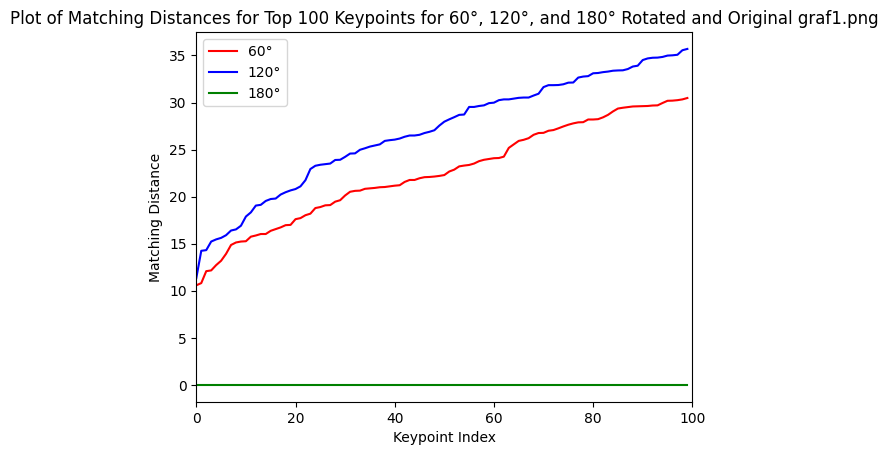

In [135]:
## Plot Comparisons of Matching Distance of Each Scaled Image ##
plt.plot(np.arange(0,100), distances4, 'r-', label="60°")
plt.plot(np.arange(0,100), distances5, 'b-', label="120°")
plt.plot(np.arange(0,100), distances6, 'g-', label="180°")
plt.xlim([0,100])
plt.xlabel("Keypoint Index")
plt.ylabel("Matching Distance")
plt.title("Plot of Matching Distances for Top 100 Keypoints for 60°, 120°, and 180° Rotated and Original graf1.png")
plt.legend()
plt.show()

## Answer to Question

1.   Discuss how rotation affects the matching distances in a markdown cell.
*   *Matching distance infers similarity between the matches in the two images. A lower distance indicates a better match. By looking at the "Plot of Matching Distances for Top 100 Keypoints" for each of the rotated image compared with the original image, 180° rotation shows perfect matching with the 0° Original Image. As the angles deviates from 0° and 180°, the matching distance increases.*